# Proyecto: Captura y Analisis de Actas Electorales 2025  
**Autor:** CERVANTES TORRES ATZEL ALAN
**Curso:** Inteligencia Artificial II  
**Fecha:** 2025-08-29   

## Presentacion

Este cuadernillo documenta el pipeline completo para extraer informacion de actas electorales (eleccion presidencial 2025), entrenar y evaluar un modelo CNN (EfficientNet) para el reconocimiento de digitos, aplicar OCR para campos alfanumericos (mesa), y persistir resultados en una base de datos.  
Incluye: preprocesamiento, troceado por guias visuales, entrenamiento con MNIST, graficas, predicciones, evaluaciones y un flujo **end-to-end** de carga de acta → procesamiento → inferencia → almacenamiento.

> **Objetivo principal:** automatizar la captura de: **numero de mesa, votos por partido, blancos, nulos**.

---

Montar Google Drive

In [1]:
# PASO 1 - Setup y utilidades base de preprocesamiento

# --- dependencias (silencioso) ---
!apt-get -y install tesseract-ocr >/dev/null
!pip -q install opencv-python-headless==4.10.0.84 pytesseract imutils matplotlib numpy tqdm >/dev/null

# --- imports y montaje de Drive ---
from google.colab import drive
drive.mount('/content/drive')

import os, re, glob, math
import numpy as np
import cv2 as cv
import pytesseract
import matplotlib.pyplot as plt

Mounted at /content/drive


# 1ER PROCESO
**Objetivo:**  
- Seleccionar una acta **al azar** desde `ActasPrueba/`.  
- Aplicar warp de documento.  
- Detectar y recortar:
  - Bloque azul de PRESIDENTE.
  - Bloque izquierdo `ID_0003`.  

Celda B1 — Detección de documento, bloque PRESIDENTE y bloque izquierdo (solo muestra)

>>> acta al azar: /content/drive/MyDrive/ActasPrueba/acta_26/acta.jpg


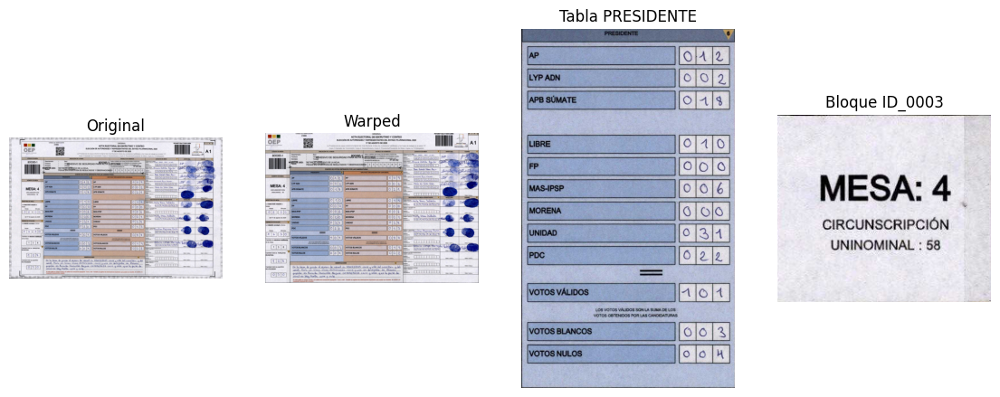

In [2]:
# PASO 1 - proceso inicial: warp + tabla PRESIDENTE + ID_0003 (una sola celda con comentarios)

import os, glob, random, math
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# --- configuracion ---
ROOT_DIR = '/content/drive/MyDrive/ActasPrueba'  # carpeta donde estan las actas
TMP_DIR  = '/content/tmp_proceso01'              # carpeta temporal en Colab
os.makedirs(TMP_DIR, exist_ok=True)

TARGET_W, TARGET_H = 2200, 1550
HSV_LOWER = np.array([90,30,30], np.uint8)       # rango azul inferior
HSV_UPPER = np.array([130,255,255], np.uint8)    # rango azul superior

# --- leer imagen con rutas UTF-8 ---
def imread_utf8(p):
    return cv.imdecode(np.fromfile(p, np.uint8), cv.IMREAD_COLOR)

# --- ordenar 4 puntos (para warp) ---
def order_quad(pts):
    s = pts.sum(1); d = np.diff(pts, 1).reshape(-1)
    return np.array([pts[np.argmin(s)], pts[np.argmin(d)],
                     pts[np.argmax(s)], pts[np.argmax(d)]], np.float32)

# --- warp del documento para corregir perspectiva ---
def warp_document(img, w=TARGET_W, h=TARGET_H):
    g = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    e = cv.Canny(cv.GaussianBlur(g,(5,5),0), 50, 150)
    e = cv.dilate(e, np.ones((3,3), np.uint8), 1)
    cnts,_ = cv.findContours(e, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return cv.resize(img, (w,h))
    c = max(cnts, key=cv.contourArea)
    peri = cv.arcLength(c, True)
    approx = cv.approxPolyDP(c, 0.02*peri, True)
    if len(approx) != 4:
        return cv.resize(img, (w,h))
    M = cv.getPerspectiveTransform(
        order_quad(approx.reshape(4,2).astype(np.float32)),
        np.array([[0,0],[w-1,0],[w-1,h-1],[0,h-1]], np.float32)
    )
    return cv.warpPerspective(img, M, (w,h), flags=cv.INTER_CUBIC)

# --- deteccion bloque azul de PRESIDENTE ---
def detect_blue_block_rect(warped):
    hsv  = cv.cvtColor(warped, cv.COLOR_BGR2HSV)
    mask = cv.inRange(hsv, HSV_LOWER, HSV_UPPER)
    mask = cv.morphologyEx(mask, cv.MORPH_OPEN, np.ones((5,5), np.uint8))
    mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, np.ones((9,9), np.uint8))
    cnts,_ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return None
    return cv.boundingRect(max(cnts, key=cv.contourArea))

# --- detectar bloques de la izquierda (ej: ID_0003) ---
def detect_left_blocks_by_lines(left_roi, min_line_len_ratio=0.62):
    H,W = left_roi.shape[:2]
    g = cv.cvtColor(left_roi, cv.COLOR_BGR2GRAY)
    binv = cv.adaptiveThreshold(cv.GaussianBlur(g,(3,3),0), 255,
                                cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY_INV, 31, 10)
    klen = max(15, int(W*0.12))
    hlines = cv.morphologyEx(binv, cv.MORPH_OPEN,
                             cv.getStructuringElement(cv.MORPH_RECT,(klen,1)), 1)
    hlines = cv.dilate(hlines, np.ones((3,3), np.uint8), 1)
    proj = hlines.sum(1)
    thr = 0.35*proj.max() if proj.max()>0 else 1e9
    ys = np.where(proj >= thr)[0].tolist()

    groups, curr = [], []
    for y in ys:
        if not curr or y == curr[-1] + 1: curr.append(y)
        else: groups.append(curr); curr = [y]
    if curr: groups.append(curr)

    centers = []
    min_len = int(min_line_len_ratio * W)
    for gset in groups:
        yc = (gset[0] + gset[-1]) // 2
        row = hlines[yc, :]
        run = mx = 0
        for px in row:
            run = run + 1 if px > 0 else 0
            mx = max(mx, run)
        if mx >= min_len:
            centers.append(yc)

    centers.sort()
    seps = [0] + centers + [H-1]
    padX = int(0.02 * W)
    blocks = []
    for i in range(len(seps)-1):
        y0, y1 = seps[i] + 1, seps[i+1] - 1
        if y1 - y0 < int(0.10 * H):
            continue
        blocks.append((padX, y0, W - 2*padX, y1 - y0))
    return sorted(blocks, key=lambda r: (r[1], r[0]))

# --- elegir una acta al azar ---
def elegir_acta_azar(root):
    cands = []
    for d in sorted(glob.glob(os.path.join(root,'acta_*'))):
        for ext in ('.jpg','.jpeg','.png'):
            p = os.path.join(d, 'acta'+ext)
            if os.path.exists(p): cands.append(p); break
        else:
            g = sorted(glob.glob(os.path.join(d, 'acta.*')))
            if g: cands.append(g[0])
    return random.choice(cands) if cands else None

# --- funcion principal ---
def procesar_acta_01(path=None, root=ROOT_DIR, tmpdir=TMP_DIR):
    os.makedirs(tmpdir, exist_ok=True)
    if path is None:
        path = elegir_acta_azar(root)
        assert path, "no se encontraron actas"
        print(">>> acta al azar:", path)
    else:
        print(">>> procesando acta:", path)

    # paso 1: leer y warp
    img = imread_utf8(path)
    warped = warp_document(img)

    # paso 2: recorte PRESIDENTE
    blue_roi = None
    blue_rect = detect_blue_block_rect(warped)
    if blue_rect:
        xb,yb,wb,hb = blue_rect
        blue_roi = warped[yb:yb+hb, xb:xb+wb].copy()

    # paso 3: recorte ID_0003
    id3_crop = None
    if blue_rect:
        left_roi = warped[:, :xb].copy()
    else:
        left_roi = warped[:, :warped.shape[1]//3].copy()
    blocks = detect_left_blocks_by_lines(left_roi)
    if len(blocks) >= 3:
        x,y,w,h = blocks[2]
        id3_crop = left_roi[y:y+h, x:x+w].copy()

    # guardar resultados en carpeta temporal
    cv.imwrite(os.path.join(tmpdir,'warp.jpg'), warped)
    if blue_roi is not None: cv.imwrite(os.path.join(tmpdir,'presidente.jpg'), blue_roi)
    if id3_crop is not None: cv.imwrite(os.path.join(tmpdir,'id_0003.jpg'), id3_crop)

    # mostrar paso a paso
    imgs, titles = [img, warped], ["Original","Warped"]
    if blue_roi is not None: imgs.append(blue_roi); titles.append("Tabla PRESIDENTE")
    if id3_crop is not None: imgs.append(id3_crop); titles.append("Bloque ID_0003")

    plt.figure(figsize=(14,8))
    for i, (im, t) in enumerate(zip(imgs,titles)):
        plt.subplot(1,len(imgs),i+1)
        plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
        plt.title(t); plt.axis("off")
    plt.show()

    return {"warp": warped, "presidente": blue_roi, "id_0003": id3_crop}

# --- ejecutar ---
_ = procesar_acta_01(path=None)  # si no pasas path, toma un acta cualquiera


#2DO PROCESO :

**Objetivo**  
Tomar la salida del **PASO 1** (`presidente` ROI) y segmentar la **banda derecha** donde estan los numeros de:  
AP, LYP ADN, APB SUMATE, LIBRE, FP, MAS IPSP, MORENA, UNIDAD, PDC, VOTOS VALIDOS, VOTOS BLANCOS, VOTOS NULOS.  
Se generan hasta **12 celdas** listas para OCR/CNN.

[INFO] Usando PRESIDENTE: /content/drive/MyDrive/ActasPrueba/acta_01/proceso01/presidente.jpg


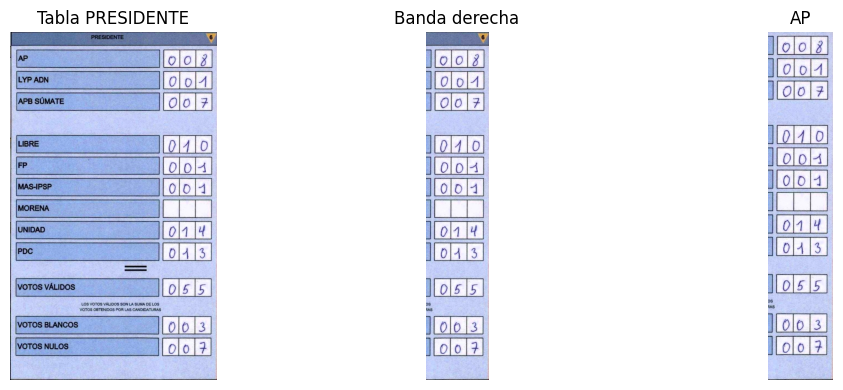

[OK] Generados en /content/tmp_proceso02: presidente.jpg, banda_derecha.jpg, AP.png


In [3]:
# PASO 2 — MOSTRAR: Tabla PRESIDENTE, Banda Derecha y AP

import os, glob
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# ====== Config ======
ROOT = "/content/drive/MyDrive/ActasPrueba"     # raíz del dataset
INPUT_PATH = None                                # opcional: ruta directa a la imagen de la TABLA PRESIDENTE (BGR)
OUT_DIR = "/content/tmp_proceso02"
os.makedirs(OUT_DIR, exist_ok=True)

# ====== Helper: elegir una imagen de PRESIDENTE si no se pasa ruta ======
def pick_presidente(root):
    # intenta candidatos obvios producidos por tus pasos previos
    cands = []
    cands += glob.glob(os.path.join(root, "acta_*", "proceso01", "presidente.*"))
    cands += glob.glob(os.path.join(root, "acta_*", "proceso02", "presidente.*"))
    # si no hay, toma cualquier imagen como último recurso
    if not cands:
        cands = glob.glob(os.path.join(root, "acta_*", "**", "*.png"), recursive=True)
        cands += glob.glob(os.path.join(root, "acta_*", "**", "*.jpg"), recursive=True)
        cands += glob.glob(os.path.join(root, "acta_*", "**", "*.jpeg"), recursive=True)
    return sorted(cands)[0] if cands else None

# ====== Helpers de este paso ======
def enhance_color(bgr, sat=1.30, val=1.15):
    hsv = cv.cvtColor(bgr, cv.COLOR_BGR2HSV).astype(np.float32)
    h,s,v = cv.split(hsv)
    s = np.clip(s*sat, 0, 255); v = np.clip(v*val, 0, 255)
    return cv.cvtColor(cv.merge([h,s,v]).astype(np.uint8), cv.COLOR_HSV2BGR)

def detect_right_band(pres_bgr, min_h_frac=0.35, right_gate=0.45, pad=12, shrink=0.85):
    H, W = pres_bgr.shape[:2]
    gray = cv.cvtColor(pres_bgr, cv.COLOR_BGR2GRAY)
    thr  = cv.threshold(gray, 200, 255, cv.THRESH_BINARY)[1]
    thr  = cv.morphologyEx(thr, cv.MORPH_OPEN,  np.ones((3,3), np.uint8), 1)
    thr  = cv.morphologyEx(thr, cv.MORPH_CLOSE, np.ones((7,7), np.uint8), 1)
    cnts,_ = cv.findContours(thr, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cand=[]
    for c in cnts:
        x,y,w,h = cv.boundingRect(c)
        if h > min_h_frac*H and x > int(right_gate*W):
            cand.append((x,y,w,h))
    if cand:
        x0 = min(x for x,_,_,_ in cand); y0 = min(y for _,y,_,_ in cand)
        x1 = max(x+w for x,_,w,_ in cand); y1 = max(y+h for _,y,_,h in cand)
        x0 = max(0, x0-pad); y0 = max(0, y0-pad); x1 = min(W, x1+pad); y1 = min(H, y1+pad)
        wbox = x1-x0; x0 = int(x1 - wbox*shrink)  # acercamos a la derecha
        return pres_bgr[y0:y1, x0:x1].copy()
    # fallback: último 30% a la derecha
    return pres_bgr[:, int(0.70*W):].copy()

def detect_cells(band):
    # devuelve celdas largas (filas) ordenadas de arriba a abajo
    H,W = band.shape[:2]
    gray = cv.cvtColor(band, cv.COLOR_BGR2GRAY)
    thr  = cv.threshold(gray, 200, 255, cv.THRESH_BINARY)[1]
    thr  = cv.morphologyEx(thr, cv.MORPH_OPEN,  np.ones((3,3), np.uint8), 1)
    thr  = cv.morphologyEx(thr, cv.MORPH_CLOSE, np.ones((7,7), np.uint8), 1)
    cnts,_ = cv.findContours(thr, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    boxes=[]
    for c in cnts:
        x,y,w,h = cv.boundingRect(c)
        if h > 0.02*H and w > 0.5*W:   # rectángulos largos tipo fila
            boxes.append((x,y,w,h))
    boxes.sort(key=lambda b: b[1])
    return [band[y:y+h, x:x+w].copy() for x,y,w,h in boxes]

# ====== Cargar PRESIDENTE ======
if INPUT_PATH is None:
    INPUT_PATH = pick_presidente(ROOT)
    assert INPUT_PATH is not None, "No se encontró ninguna imagen de PRESIDENTE en el dataset."
    print(f"[INFO] Usando PRESIDENTE: {INPUT_PATH}")
else:
    print(f"[INFO] PRESIDENTE (manual): {INPUT_PATH}")

pres_in = cv.imread(INPUT_PATH)
assert pres_in is not None, f"No se pudo leer: {INPUT_PATH}"

# ====== Procesamiento ======
pres = enhance_color(pres_in, 1.30, 1.15)   # 1) Tabla PRESIDENTE (realzada)
band = detect_right_band(pres, shrink=0.85) # 2) Banda derecha
cells = detect_cells(band)                   # 3) Filas de la banda
ap = cells[0] if cells else None            # 4) AP = primera fila

# Guardado temporal SOLO para inspección (no Drive)
cv.imwrite(f"{OUT_DIR}/presidente.jpg", pres)
cv.imwrite(f"{OUT_DIR}/banda_derecha.jpg", band)
if ap is not None:
    cv.imwrite(f"{OUT_DIR}/AP.png", ap)

# ====== Mostrar SOLO lo pedido: PRESIDENTE, BANDA, AP ======
n = 3 if ap is not None else 2
plt.figure(figsize=(12,4))
plt.subplot(1,n,1); plt.imshow(cv.cvtColor(pres, cv.COLOR_BGR2RGB)); plt.title("Tabla PRESIDENTE"); plt.axis("off")
plt.subplot(1,n,2); plt.imshow(cv.cvtColor(band, cv.COLOR_BGR2RGB)); plt.title("Banda derecha"); plt.axis("off")
if ap is not None:
    plt.subplot(1,n,3); plt.imshow(cv.cvtColor(ap, cv.COLOR_BGR2RGB)); plt.title("AP"); plt.axis("off")
plt.tight_layout(); plt.show()

print(f"[OK] Generados en {OUT_DIR}: presidente.jpg, banda_derecha.jpg" + (", AP.png" if ap is not None else ""))


#3ER PROCESO :
— De la celda AP -> recorte de casillas (dígitos)
Conectado a PASO 1 y PASO 2:
- Si no le pasas nada, recupera PRESIDENTE, BANDA y AP usando las funciones previas.
 - Guarda SOLO en Colab: /content/tmp_proceso03/casillas/

Se han encontrado y guardado 12 casillas en /content/drive/MyDrive/ActasPrueba/acta_09/casillas_recortadas


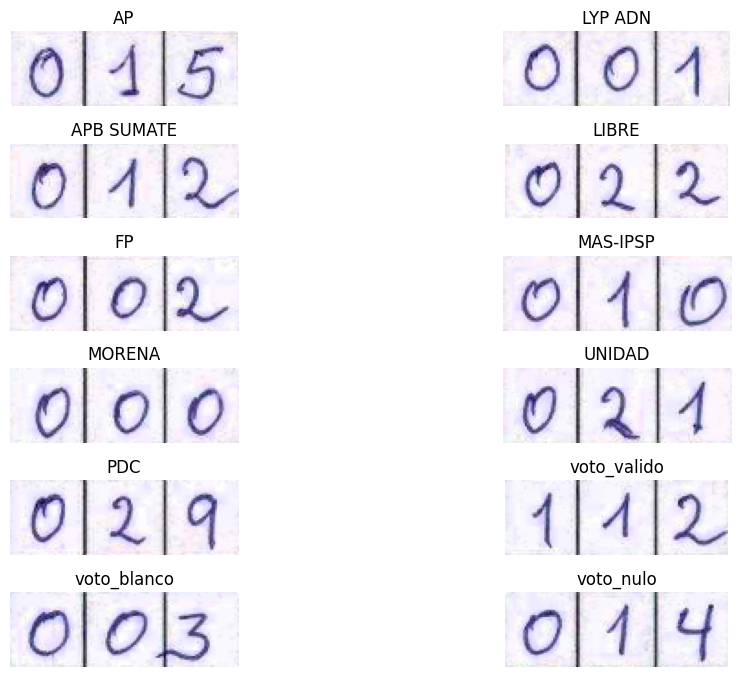

In [4]:
import cv2 as cv
import numpy as np
import os
import matplotlib.pyplot as plt

# Directorio base para las actas
ACTA_TAG = 'acta_09'
ROOT = '/content/drive/MyDrive/ActasPrueba'
AP_PATH = f'{ROOT}/{ACTA_TAG}/proceso02/AP.png'

# Nombres de las casillas en orden
NOMBRES_CASILLAS = [
    "AP",
    "LYP ADN",
    "APB SUMATE",
    "LIBRE",
    "FP",
    "MAS-IPSP",
    "MORENA",
    "UNIDAD",
    "PDC",
    "voto_valido",
    "voto_blanco",
    "voto_nulo"
]

# Cargar la imagen
if not os.path.exists(AP_PATH):
    print(f"Error: No se encontró la imagen: {AP_PATH}")
    exit()

img = cv.imread(AP_PATH)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Umbralizar para detectar las casillas
_, thresh = cv.threshold(gray, 127, 255, cv.THRESH_BINARY_INV)

# Detectar contornos de las casillas
contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Recortar y guardar las casillas
output_dir = f'{ROOT}/{ACTA_TAG}/casillas_recortadas'
os.makedirs(output_dir, exist_ok=True)

casillas_recortadas = []
# Ordenar los contornos de arriba a abajo para que coincidan con los nombres
contours_sorted = sorted(contours, key=lambda c: cv.boundingRect(c)[1])

for i, contour in enumerate(contours_sorted):
    x, y, w, h = cv.boundingRect(contour)

    # Filtrar contornos irrelevantes
    if w > 50 and h > 20 and w < 200:
        margin = -4
        x1 = max(0, x - margin)
        y1 = max(0, y - margin)
        x2 = min(img.shape[1], x + w + margin)
        y2 = min(img.shape[0], y + h + margin)

        casilla = img[y1:y2, x1:x2]
        casillas_recortadas.append(casilla)

        # Asignar nombre si está en la lista y guardar
        if i < len(NOMBRES_CASILLAS):
            nombre = NOMBRES_CASILLAS[i]
            cv.imwrite(f'{output_dir}/{nombre}.png', casilla)
        else:
            # Si hay más casillas, usar un nombre genérico
            cv.imwrite(f'{output_dir}/casilla_{i}.png', casilla)

print(f"Se han encontrado y guardado {len(casillas_recortadas)} casillas en {output_dir}")

# Mostrar las casillas con sus nombres
plt.figure(figsize=(10, 8))
for i, casilla in enumerate(casillas_recortadas):
    plt.subplot(len(casillas_recortadas) // 2 + 1, 2, i + 1)
    plt.imshow(cv.cvtColor(casilla, cv.COLOR_BGR2RGB))
    # Usar el nombre de la lista si está disponible
    if i < len(NOMBRES_CASILLAS):
        plt.title(f'{NOMBRES_CASILLAS[i]}')
    else:
        plt.title(f'Casilla {i}')
    plt.axis('off')
plt.tight_layout()
plt.show()

# CUARTO PROCESO — Corte de los **3 dígitos** (banda derecha) y visualización

**Qué hace:**  
A partir de una fila de la banda derecha (ej. `FP.png`) detecta las **dos barras verticales** y recorta los **tres dígitos** (centenas–decenas–unidades).  
Solo **muestra en pantalla**: imagen con barras + cada dígito (afilado). **No guarda en Drive.**

**Entradas:** `ROOT/acta_xx/proceso03/FP.png` (puedes cambiar `ACTA_TAG` o el nombre del archivo).  
**Salidas:** Visualización de:
- Imagen con líneas de corte
- Dígito 1, Dígito 2, Dígito 3

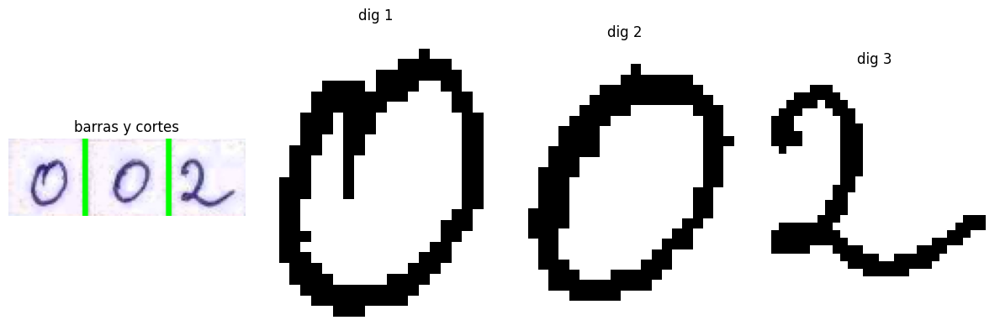

In [5]:
# proceso04 - prueba (no guarda nada)
# entrada: ROOT/acta_xx/proceso03/FP.png
# salida: solo visualizacion en pantalla

import cv2 as cv
import numpy as np
import os
import matplotlib.pyplot as plt

# ---- entrada de prueba ----
ACTA_TAG = 'acta_09'  # <- edita aqui
ROOT = '/content/drive/MyDrive/ActasPrueba'
AP_PATH = f'{ROOT}/{ACTA_TAG}/proceso03/FP.png'

assert os.path.exists(AP_PATH), f"no existe: {AP_PATH}"

img = cv.imread(AP_PATH)
h, w = img.shape[:2]

# ---------- detectar barras verticales ----------
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
bw_inv = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]

# mantener estructuras verticales largas
k = cv.getStructuringElement(cv.MORPH_RECT, (1, max(25, h//2)))
bars = cv.morphologyEx(bw_inv, cv.MORPH_OPEN, k, iterations=1)
bars = cv.dilate(bars, cv.getStructuringElement(cv.MORPH_RECT,(3,3)), iterations=1)

# proyeccion vertical para ubicar columnas de barra
col_sum = bars.sum(axis=0)
thr = 0.6 * col_sum.max() if col_sum.max() > 0 else 1e9
cand = np.where(col_sum >= thr)[0].tolist()

# agrupar columnas contiguas y tomar el centro de cada barra
groups = []
curr = []
for x in cand:
    if not curr or x == curr[-1] + 1:
        curr.append(x)
    else:
        groups.append(curr)
        curr = [x]
if curr: groups.append(curr)

bar_x = [int((g[0] + g[-1]) / 2) for g in groups]
# filtrar bordes extremos
bar_x = [x for x in bar_x if int(0.10*w) < x < int(0.90*w)]
bar_x = sorted(bar_x)

# elegir las 2 barras internas mas probables; si no hay, fallback en tercios
if len(bar_x) >= 2:
    # si hay mas de 2, elegir el par que divida en 3 segmentos mas balanceados
    best = None
    xs = bar_x
    for i in range(len(xs)):
        for j in range(i+1, len(xs)):
            a, b = xs[i], xs[j]
            segs = [a, b-a, w-b]
            score = -np.std(segs)  # menor desviacion -> mejor
            if best is None or score > best[0]:
                best = (score, a, b)
    _, x1, x2 = best
else:
    x1, x2 = w//3, 2*w//3

# padding lateral para cada digito
pad = max(2, w//200)

# limites de los 3 cortes
cuts = [(0, x1-pad), (x1+pad, x2-pad), (x2+pad, w)]

digits = []
for i, (xa, xb) in enumerate(cuts, start=1):
    roi = img[:, max(0,xa):min(w,xb)]
    # refinar vertical (arriba/abajo) segun el contenido del digito
    g = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)
    bw = cv.threshold(g, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]  # digito negro
    # encontrar bounding de pixeles negros
    ys, xs = np.where(bw == 0)
    if len(xs) > 0 and len(ys) > 0:
        y0, y1 = max(0, ys.min()-2), min(h, ys.max()+2)
        x0, x1r = max(0, xs.min()-2), min(roi.shape[1], xs.max()+2)
        roi = roi[y0:y1, x0:x1r]
        g = g[y0:y1, x0:x1r]
        bw = bw[y0:y1, x0:x1r]

    # 1) digito negro: ya es bw con THRESH_BINARY (negro=0, blanco=255)
    black_digit = bw.copy()

    # 2) nitidez: unsharp sobre la version en grises y luego re-binarizar
    blur = cv.GaussianBlur(g, (0,0), 1.0)
    sharp = cv.addWeighted(g, 1.6, blur, -0.6, 0)
    sharp_bw = cv.threshold(sharp, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]

    digits.append((roi, black_digit, sharp_bw))

# ---------- visualizar sin guardar ----------
plt.figure(figsize=(12,5))
plt.subplot(1,4,1)
viz = img.copy()
# dibujar barras detectadas
if 'x1' in locals() and 'x2' in locals():
    cv.line(viz, (x1,0), (x1,h), (0,255,0), 2)
    cv.line(viz, (x2,0), (x2,h), (0,255,0), 2)
plt.imshow(cv.cvtColor(viz, cv.COLOR_BGR2RGB))
plt.title("barras y cortes"); plt.axis('off')

for i, (roi, black_digit, sharp_bw) in enumerate(digits, start=1):
    plt.subplot(1,4,i+1)
    # mostrar la version nidia (sharp_bw). puedes cambiar a black_digit si prefieres
    plt.imshow(sharp_bw, cmap='gray')
    plt.title(f'dig {i}')
    plt.axis('off')

plt.tight_layout()
plt.show()


# 2) Entrenamiento de CNN – EfficientNet con MNIST

**Dataset base:** `ghnshymsaini/mnist-handwritten-digits-dataset`  
**Proposito:** preentrenar un clasificador solido de digitos (0–9) sobre imagenes `128x128` para transferirlo luego a las celdas de actas.

**Configuracion clave**
- Redimension: `128x128x3`
- Normalizacion: `[0,1]`
- Split: `train / val / test`
- Aumentos leves: shift, rotacion, zoom
- Optimizador: AdamW + ReduceLROnPlateau
- Regularizacion: dropout + weight decay
- Callbacks: EarlyStopping, ModelCheckpoint

**Metricas a reportar**
- Accuracy (train/val/test)
- Precision macro, Recall macro, F1 macro (post-entrenamiento)
- Matriz de confusion

#Descargar MNIST (KaggleHub) y limpiar modelo anterior

In [6]:
# 1) Descargar dataset desde KaggleHub
!pip install --quiet kagglehub

import kagglehub, os, shutil, glob

path = kagglehub.dataset_download("ghnshymsaini/mnist-handwritten-digits-dataset")
print("Path to dataset files:", path)

# Usualmente el dataset viene en: .../mnist_png/{train,test}/{0..9}
# Buscamos la carpeta que contiene 'train' y 'test'
def find_split_root(base):
    for root, dirs, files in os.walk(base):
        if all(d in dirs for d in ["train","test"]):
            return root
    return None

SPLIT_ROOT = find_split_root(path)
assert SPLIT_ROOT is not None, f"No se encontró estructura train/test en {path}"
TRAIN_DIR = os.path.join(SPLIT_ROOT, "train")
TEST_DIR  = os.path.join(SPLIT_ROOT, "test")
print("TRAIN_DIR:", TRAIN_DIR)
print("TEST_DIR :", TEST_DIR)

# 2) Limpiar modelo previo entrenado con nuestros dígitos (si existe)
ACTAS_ROOT = "/content/drive/MyDrive/ActasFile"
OLD_MODEL  = os.path.join(ACTAS_ROOT, "efficientnet_digits_b0.pt")
if os.path.exists(OLD_MODEL):
    os.remove(OLD_MODEL)
    print("Eliminado modelo previo:", OLD_MODEL)
else:
    print("No había modelo previo en:", OLD_MODEL)


100%|██████████| 28.2M/28.2M [00:01<00:00, 22.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ghnshymsaini/mnist-handwritten-digits-dataset/versions/1
TRAIN_DIR: /root/.cache/kagglehub/datasets/ghnshymsaini/mnist-handwritten-digits-dataset/versions/1/mnist_png/train
TEST_DIR : /root/.cache/kagglehub/datasets/ghnshymsaini/mnist-handwritten-digits-dataset/versions/1/mnist_png/test
No había modelo previo en: /content/drive/MyDrive/ActasFile/efficientnet_digits_b0.pt


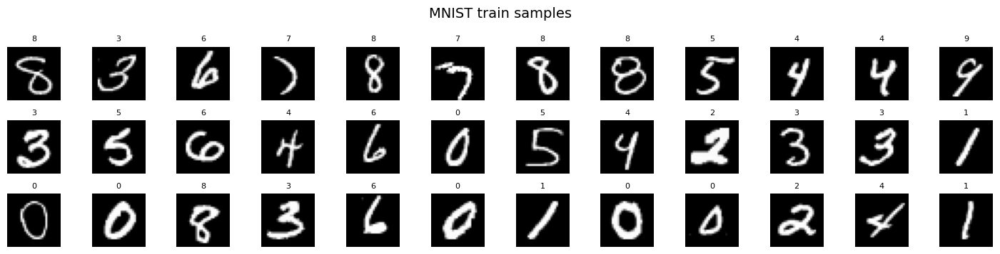

In [9]:
# Preview MNIST desde TRAIN_DIR ya definido
import random, os
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

visTfms = transforms.Compose([transforms.Grayscale(num_output_channels=1), transforms.ToTensor()])
mnistTrain = datasets.ImageFolder(TRAIN_DIR, transform=visTfms)

n = 36
cols = 12
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(cols*1.2, rows*1.2))
for ax in axes.flat:
    ax.axis('off')

indices = random.sample(range(len(mnistTrain)), n)
for ax, idx in zip(axes.flat, indices):
    img, label = mnistTrain[idx]
    ax.imshow(img.squeeze(0), cmap='gray')
    ax.set_title(str(label), fontsize=8)
plt.suptitle('MNIST train samples', fontsize=14)
plt.tight_layout()
plt.show()


#Activar/usar GPU T4 y preparar DataLoaders (resize a 128×128)

In [7]:
# Activar/cuadrar GPU para PyTorch
import os, torch, subprocess

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

try:
    print(subprocess.check_output(["nvidia-smi", "-L"], text=True))
except Exception as e:
    print("nvidia-smi no disponible:", e)

import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Transforms: redimensionar a 128×128, canal único → 3 canales, tipo float32
train_tfms = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.expand(3, *x.shape[1:])),
    transforms.RandomAffine(degrees=6, translate=(0.05,0.05), scale=(0.95,1.05), shear=3),
    transforms.ConvertImageDtype(torch.float32),
])
test_tfms = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.expand(3, *x.shape[1:])),
    transforms.ConvertImageDtype(torch.float32),
])

train_ds = datasets.ImageFolder(TRAIN_DIR, transform=train_tfms)
test_ds  = datasets.ImageFolder(TEST_DIR,  transform=test_tfms)
print("Clases:", train_ds.classes)

def loader_kwargs(batch_size=256):
    return dict(
        batch_size=batch_size,
        num_workers=min(8, os.cpu_count() or 2),
        pin_memory=torch.cuda.is_available(),
        persistent_workers=torch.cuda.is_available(),
        prefetch_factor=2,
        shuffle=True
    )

train_loader = DataLoader(train_ds, **loader_kwargs(256))
test_loader  = DataLoader(test_ds,  **loader_kwargs(256) | {"shuffle": False})
print(f"Train: {len(train_ds)} imágenes | Test: {len(test_ds)} imágenes")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device, "| GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


nvidia-smi no disponible: [Errno 2] No such file or directory: 'nvidia-smi'
Clases: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
Train: 60000 imágenes | Test: 10000 imágenes
Device: cpu | GPU: CPU


#**Entrenar EfficientNet-B0 (métricas por época)  pesos**

In [ ]:
import torch, torch.nn as nn
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import time, os

weights = EfficientNet_B0_Weights.IMAGENET1K_V1
model = efficientnet_b0(weights=weights)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 10)
model = model.to(device)

# Hiperparámetros
epochs = 12
lr = 3e-4
wd = 1e-4
use_amp = True

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)
scaler = GradScaler(enabled=use_amp)

hist = {"train_loss":[], "test_loss":[], "test_acc":[]}
BEST_PATH = os.path.join(ACTAS_ROOT, "efficientnet_mnist_b0.pt")
best_acc = 0.0

for ep in range(1, epochs+1):
    t0 = time.time()
    # ---- Train ----
    model.train()
    tr_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {ep}/{epochs} [train]")
    for xb, yb in pbar:
        xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with autocast(enabled=use_amp):
            logits = model(xb)
            loss = criterion(logits, yb)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        tr_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")
    tr_loss /= max(1, len(train_loader))

    # ---- Test ----
    model.eval()
    te_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        pbar = tqdm(test_loader, desc=f"Epoch {ep}/{epochs} [test]")
        for xb, yb in pbar:
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            with autocast(enabled=use_amp):
                logits = model(xb)
                loss = criterion(logits, yb)
            te_loss += loss.item()
            preds = logits.argmax(1)
            correct += (preds == yb).sum().item()
            total   += yb.numel()
            pbar.set_postfix(loss=f"{loss.item():.4f}")
    te_loss /= max(1, len(test_loader))
    te_acc  = correct / max(1, total)

    hist["train_loss"].append(tr_loss)
    hist["test_loss"].append(te_loss)
    hist["test_acc"].append(te_acc)

    dt = time.time() - t0
    print(f"[Epoch {ep:02d}] train_loss={tr_loss:.4f} | test_loss={te_loss:.4f} | test_acc={te_acc:.4f} | {dt:.1f}s")

    if te_acc > best_acc:
        best_acc = te_acc
        torch.save(model.state_dict(), BEST_PATH)
        print(f"  ▶ Guardado mejor modelo ({best_acc:.4f}) en {BEST_PATH}")

print("Fin. Mejor test_acc:", f"{best_acc:.4f}")


/tmp/ipython-input-1383437081.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=use_amp)
Epoch 1/12 [train]:   0%|          | 0/235 [00:00<?, ?it/s]/tmp/ipython-input-1383437081.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=use_amp):
Epoch 1/12 [test]:   0%|          | 0/40 [00:00<?, ?it/s]/tmp/ipython-input-1383437081.py:52: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=use_amp):
Epoch 1/12 [test]: 100%|██████████| 40/40 [00:06<00:00,  6.21it/s, loss=0.0006]


[Epoch 01] train_loss=0.1878 | test_loss=0.0217 | test_acc=0.9927 | 114.1s
  ▶ Guardado mejor modelo (0.9927) en /content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt


Epoch 2/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.86it/s, loss=0.0004]


[Epoch 02] train_loss=0.0270 | test_loss=0.0220 | test_acc=0.9925 | 56.6s


Epoch 3/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.55it/s, loss=0.0001]


[Epoch 03] train_loss=0.0206 | test_loss=0.0147 | test_acc=0.9948 | 55.7s
  ▶ Guardado mejor modelo (0.9948) en /content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt


Epoch 4/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.64it/s, loss=0.0000]


[Epoch 04] train_loss=0.0153 | test_loss=0.0130 | test_acc=0.9953 | 55.9s
  ▶ Guardado mejor modelo (0.9953) en /content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt


Epoch 5/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.67it/s, loss=0.0000]


[Epoch 05] train_loss=0.0133 | test_loss=0.0179 | test_acc=0.9946 | 56.0s


Epoch 6/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.54it/s, loss=0.0000]


[Epoch 06] train_loss=0.0116 | test_loss=0.0167 | test_acc=0.9955 | 56.0s
  ▶ Guardado mejor modelo (0.9955) en /content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt


Epoch 7/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.54it/s, loss=0.0000]


[Epoch 07] train_loss=0.0110 | test_loss=0.0143 | test_acc=0.9954 | 55.9s


Epoch 8/12 [test]: 100%|██████████| 40/40 [00:03<00:00, 13.27it/s, loss=0.0002]


[Epoch 08] train_loss=0.0103 | test_loss=0.0134 | test_acc=0.9957 | 55.9s
  ▶ Guardado mejor modelo (0.9957) en /content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt


Epoch 9/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.72it/s, loss=0.0002]


[Epoch 09] train_loss=0.0090 | test_loss=0.0192 | test_acc=0.9948 | 55.9s


Epoch 10/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.70it/s, loss=0.0000]


[Epoch 10] train_loss=0.0084 | test_loss=0.0181 | test_acc=0.9957 | 56.1s


Epoch 11/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.92it/s, loss=0.0000]


[Epoch 11] train_loss=0.0081 | test_loss=0.0132 | test_acc=0.9955 | 56.0s


Epoch 12/12 [test]: 100%|██████████| 40/40 [00:02<00:00, 13.57it/s, loss=0.0002]

[Epoch 12] train_loss=0.0075 | test_loss=0.0161 | test_acc=0.9945 | 55.9s
Fin. Mejor test_acc: 0.9957


#Celda G3 — Curvas y matriz de confusión sobre el conjunto de test

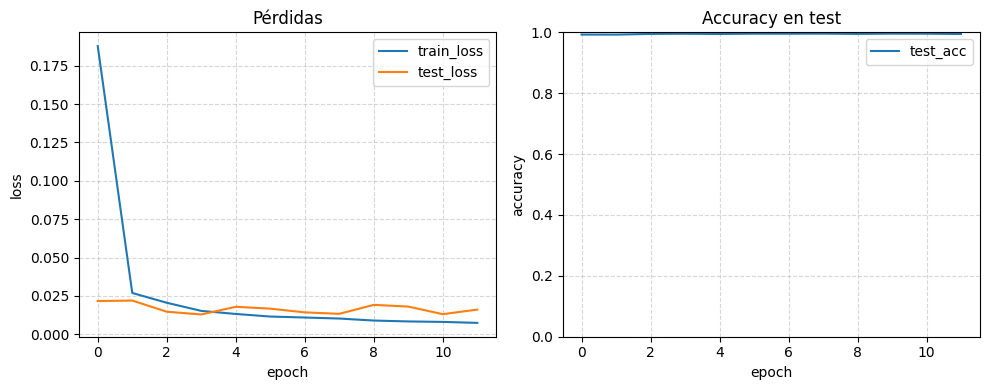

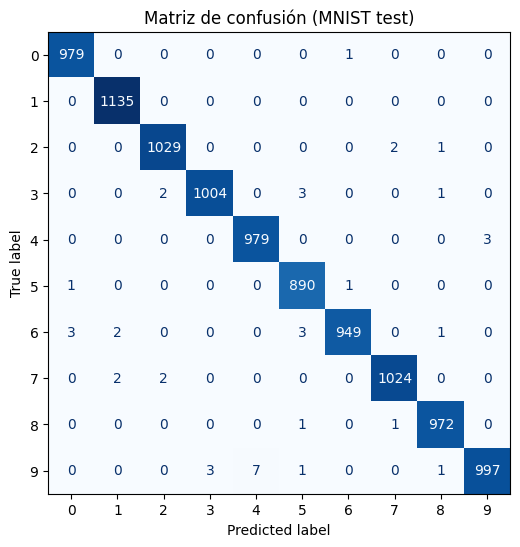

Dígito 0: acc=0.999
Dígito 1: acc=1.000
Dígito 2: acc=0.997
Dígito 3: acc=0.994
Dígito 4: acc=0.997
Dígito 5: acc=0.998
Dígito 6: acc=0.991
Dígito 7: acc=0.996
Dígito 8: acc=0.998
Dígito 9: acc=0.988


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import torch

# Curvas
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(hist["train_loss"], label="train_loss")
plt.plot(hist["test_loss"],  label="test_loss")
plt.xlabel("epoch"); plt.ylabel("loss"); plt.title("Pérdidas")
plt.grid(True, ls="--", alpha=0.5); plt.legend()

plt.subplot(1,2,2)
plt.plot(hist["test_acc"], label="test_acc")
plt.xlabel("epoch"); plt.ylabel("accuracy"); plt.ylim(0,1)
plt.title("Accuracy en test"); plt.grid(True, ls="--", alpha=0.5); plt.legend()
plt.tight_layout(); plt.show()

# Cargar mejor modelo
best_path = os.path.join(ACTAS_ROOT, "efficientnet_mnist_b0.pt")
model.load_state_dict(torch.load(best_path, map_location=device))
model.eval().to(device)

# Matriz de confusión
all_preds, all_true = [], []
with torch.no_grad():
    for xb, yb in test_loader:
        xb = xb.to(device, non_blocking=True)
        logits = model(xb)
        preds = logits.argmax(1).cpu().numpy().tolist()
        all_preds.extend(preds)
        all_true.extend(yb.numpy().tolist())

cm = confusion_matrix(all_true, all_preds, labels=list(range(10)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[str(i) for i in range(10)])
fig, ax = plt.subplots(figsize=(6,6))
disp.plot(ax=ax, cmap="Blues", colorbar=False)
plt.title("Matriz de confusión (MNIST test)")
plt.show()

acc_per_class = (cm.diagonal() / cm.sum(axis=1).clip(min=1))
for i, acc in enumerate(acc_per_class):
    print(f"Dígito {i}: acc={acc:.3f}")


In [8]:
# G2.1 verificar archivo guardado
import os, time, hashlib, torch
ACTAS_ROOT = "/content/drive/MyDrive/ActasFile"
BEST_PATH = os.path.join(ACTAS_ROOT, "efficientnet_mnist_b0.pt")

assert os.path.exists(BEST_PATH), f"no existe: {BEST_PATH}"
sizeMb = os.path.getsize(BEST_PATH)/1e6
mtime = time.ctime(os.path.getmtime(BEST_PATH))

def sha256sum(p):
    h = hashlib.sha256()
    with open(p, "rb") as f:
        for chunk in iter(lambda: f.read(1024*1024), b""):
            h.update(chunk)
    return h.hexdigest()

print("path:", BEST_PATH)
print("size_mb:", round(sizeMb,2))
print("modified:", mtime)
print("sha256:", sha256sum(BEST_PATH))


path: /content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt
size_mb: 16.38
modified: Thu Aug 28 14:56:25 2025
sha256: 81534cd53ffc05f877071d1f645219f10b8be730134eda354f87f8778adfa15e


In [10]:
# G2.2 cargar el checkpoint en un modelo nuevo y testear un mini batch
import torch, torch.nn as nn
from torchvision.models import efficientnet_b0

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

modelCheck = efficientnet_b0(weights=None)
modelCheck.classifier[1] = nn.Linear(modelCheck.classifier[1].in_features, 10)
state = torch.load(BEST_PATH, map_location="cpu")
modelCheck.load_state_dict(state)
modelCheck.eval().to(device)
print("checkpoint_ok:", isinstance(state, dict), "num_tensors:", len(state))

xb, yb = next(iter(test_loader))
xb = xb.to(device)
with torch.no_grad():
    preds = modelCheck(xb).argmax(1).cpu()
miniAcc = (preds == yb).float().mean().item()
print("mini_batch_acc:", round(miniAcc,4))


checkpoint_ok: True num_tensors: 360
mini_batch_acc: 0.9961


#**Preparar modelo entrenado para las Actas**

In [ ]:
import torch, cv2 as cv, os
import numpy as np
from torchvision import transforms
from torchvision.models import efficientnet_b0

# Ruta del modelo entrenado en MNIST
MODEL_PATH = "/content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo
model = efficientnet_b0(weights=None)
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 10)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval().to(device)

# Transform de inferencia (resize y 3 canales, nada más)
infer_tfms = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.expand(3, *x.shape[1:])),
    transforms.ConvertImageDtype(torch.float32),
])

@torch.no_grad()
def cnn_predict(img_bgr):
    """Inferencia sobre una imagen BGR cualquiera (sin filtros previos)."""
    img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    pil = transforms.functional.to_pil_image(img_rgb)
    x = infer_tfms(pil).unsqueeze(0).to(device)
    logits = model(x)
    probs = torch.softmax(logits, dim=1)[0]
    pred = int(torch.argmax(probs).item())
    return pred, float(probs[pred].item()), probs.cpu().numpy()


# 4) Preparación de nuestro dataset – Actas electorales
Vamos a dejar **todo listo** para procesar las 50 actas de `ActasPrueba/`, comparar contra el CSV de verdad y sacar **métricas globales** (MAE, exactitud por columna, exactitud de mesa, exactitud por fila) y **gráficas**.  
El flujo usa: **CNN EfficientNet (dígitos por partido)** y **OCR Tesseract (número de mesa)**. Incluye barras de progreso con `tqdm`.


In [12]:
# install deps (colab)
!pip -q install pytesseract pandas tqdm
!apt -y -qq install tesseract-ocr


tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [44]:
import os, re, pandas as pd

BASE_ACTAS = "/content/drive/MyDrive/ActasPrueba"
CSV_TRUTH  = os.path.join(BASE_ACTAS, "actasVerdaderas.csv")
assert os.path.isdir(BASE_ACTAS), f"No existe carpeta: {BASE_ACTAS}"
assert os.path.isfile(CSV_TRUTH),  f"No existe CSV: {CSV_TRUTH}"

def normalizeName(s: str) -> str:
    s = str(s).strip().lower()
    s = re.sub(r"[^a-z0-9]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

truth_df_raw = pd.read_csv(CSV_TRUTH)
truth_df = truth_df_raw.copy()
truth_df.columns = [normalizeName(c) for c in truth_df.columns]

ID_COL = "carpeta"                 # id en tu CSV
assert ID_COL in truth_df.columns
party_universe = [c for c in truth_df.columns if c not in {ID_COL, "numero_mesa"}]
print("Partidos/columnas CSV:", party_universe)

acta_dirs = sorted(
    d for d in (os.path.join(BASE_ACTAS, x) for x in os.listdir(BASE_ACTAS))
    if os.path.isdir(d) and os.path.basename(d).startswith("acta_")
)
print("Actas encontradas:", len(acta_dirs))


Partidos/columnas CSV: ['ap', 'lyp_adn', 'apb_sumate', 'libre', 'fp', 'mas_ipsp', 'morena', 'unidad', 'pdc', 'voto_valido', 'voto_blanco', 'voto_nulo']
Actas encontradas: 50


## 4.1 Cargar EfficientNet + preprocesamiento (mismo que en el entrenamiento)


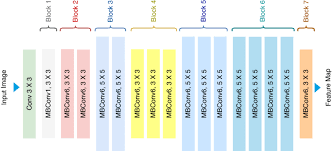

In [45]:
import torch, torch.nn as nn
from torchvision.models import efficientnet_b0
from torchvision import transforms
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BEST_MODEL_PATH = "/content/drive/MyDrive/ActasFile/efficientnet_mnist_b0.pt"
assert os.path.isfile(BEST_MODEL_PATH)

model = efficientnet_b0(weights=None)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 10)
state = torch.load(BEST_MODEL_PATH, map_location="cpu")
model.load_state_dict(state)
model.eval().to(device)

infer_tfms = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.expand(3, *x.shape[1:])),
    transforms.ConvertImageDtype(torch.float32),
])

@torch.no_grad()
def predict_digit_from_pil(pil_img: Image.Image):
    x = infer_tfms(pil_img).unsqueeze(0).to(device)
    p = torch.softmax(model(x), dim=1)[0].cpu().numpy()
    d = int(p.argmax()); c = float(p[d])
    return d, c


## 4.2 Mesa con **CNN**
Heurística: recortamos la **mitad derecha** de `mesa.png` (donde suelen estar los dígitos), binarizamos, detectamos **contornos tipo dígito**, recortamos, y clasificamos cada recorte con EfficientNet.
Incluye función `debug_mesa()` para visualizar el proceso.


In [46]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def segment_mesa_digits(mesa_path: str):
    """Devuelve lista de crops PIL con cada dígito encontrado en la mesa."""
    img = cv2.imread(mesa_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return []
    H, W = img.shape
    roi = img[:, int(0.40*W):]        # evita el texto 'MESA:' a la izquierda

    blur = cv2.GaussianBlur(roi, (3,3), 0)
    _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # invertimos si es necesario para que los dígitos queden blancos sobre negro
    if th.mean() > 127:
        th = 255 - th
    th = cv2.morphologyEx(th, cv2.MORPH_OPEN, np.ones((3,3), np.uint8), iterations=1)

    cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    boxes = []
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        area = w*h
        # filtros simples para dígitos
        if h < 0.25*H or h > 0.95*H:
            continue
        if area < 60:
            continue
        boxes.append((x,y,w,h))
    boxes = sorted(boxes, key=lambda b: b[0])

    crops = []
    for x,y,w,h in boxes:
        pad = max(2, int(0.12*max(w,h)))
        x0 = max(0, x-pad); y0 = max(0, y-pad)
        x1 = min(roi.shape[1], x+w+pad); y1 = min(roi.shape[0], y+h+pad)
        crop = roi[y0:y1, x0:x1]
        if crop.size > 0:
            crops.append(Image.fromarray(crop))
    return crops

def predict_mesa_cnn(mesa_path: str):
    """Clasifica cada crop y concatena: retorna (numero_mesa, detalles, crops)."""
    crops = segment_mesa_digits(mesa_path)
    if len(crops) == 0:
        return 0, [], []
    digits, details = [], []
    for pil_img in crops:
        d, c = predict_digit_from_pil(pil_img)
        digits.append(str(d))
        details.append((d, c))
    s = "".join(digits).lstrip("0")
    mesa_num = int(s) if s else 0
    return mesa_num, details, crops

def debug_mesa(mesa_path: str):
    """Visualiza pasos: original, ROI, threshold, bounding boxes y crops."""
    img = cv2.imread(mesa_path)
    if img is None:
        print("No se pudo leer:", mesa_path);
        return
    H, W = img.shape[:2]
    roi = img[:, int(0.40*W):]
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3,3), 0)
    _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    if th.mean() > 127:
        th = 255 - th
    th2 = cv2.morphologyEx(th, cv2.MORPH_OPEN, np.ones((3,3), np.uint8), iterations=1)
    cnts, _ = cv2.findContours(th2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    vis = roi.copy()
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        if h < 0.25*H or h > 0.95*H or w*h < 60:
            continue
        cv2.rectangle(vis, (x,y), (x+w, y+h), (0,255,0), 2)

    plt.figure(figsize=(10,6))
    plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.title("mesa.png (full)")
    plt.subplot(1,3,2); plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.title("ROI derecha")
    plt.subplot(1,3,3); plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.title("Boxes detectados")
    plt.tight_layout(); plt.show()

    crops = [Image.fromarray(cv2.cvtColor(roi[y:y+h, x:x+w], cv2.COLOR_BGR2GRAY))
             for c in cnts for (x,y,w,h) in [cv2.boundingRect(c)] if h >= 0.25*H and h <= 0.95*H and w*h>=60]
    if crops:
        cols = min(6, len(crops)); rows = int(np.ceil(len(crops)/cols))
        plt.figure(figsize=(cols*1.5, rows*1.5))
        for i, ci in enumerate(crops, 1):
            plt.subplot(rows, cols, i); plt.imshow(ci, cmap="gray"); plt.axis("off")
        plt.suptitle("crops de dígitos (mesa)"); plt.tight_layout(); plt.show()


## 4.3 Partidos con CNN (1.png..3.png por carpeta)


In [47]:
import glob
from tqdm.auto import tqdm

def list_parties(p04_dir: str):
    return sorted([x for x in os.listdir(p04_dir) if os.path.isdir(os.path.join(p04_dir, x))])

def predict_party_folder(party_folder: str, show_bar: bool = True):
    files = glob.glob(os.path.join(party_folder, "*.png"))
    def key_fn(p):
        m = re.search(r"(\d+)", os.path.basename(p))
        return int(m.group(1)) if m else 0
    files = sorted(files, key=key_fn)

    digits, detail = [], []
    iterable = tqdm(files, desc=f"party:{os.path.basename(party_folder)}", leave=False) if show_bar else files
    for p in iterable:
        pil = Image.open(p).convert("L")
        d, c = predict_digit_from_pil(pil)
        digits.append(str(d)); detail.append((os.path.basename(p), d, c))
    s = "".join(digits).lstrip("0")
    return int(s) if s else 0, detail


## Procesar **las 50 actas** con CNN (mesa + partidos) y armar `pred_df`


In [48]:
from tqdm.auto import tqdm
import pandas as pd

def extract_num(s):
    m = re.search(r"\d+", str(s))
    return int(m.group(0)) if m else None

def get_truth_row(acta_id: str):
    df = truth_df.copy()
    df["__key__"] = df[ID_COL].astype(str).apply(normalizeName)
    row = df[df["__key__"] == normalizeName(acta_id)]
    if not row.empty: return row.iloc[0]
    n = extract_num(acta_id)
    if n is not None:
        df["__num__"] = df[ID_COL].apply(extract_num)
        row = df[df["__num__"] == n]
        if not row.empty: return row.iloc[0]
    return None

def process_all_actas_cnn(acta_dirs):
    pred_rows, detail_rows = [], []
    for acta_dir in tqdm(acta_dirs, desc="actas", dynamic_ncols=True):
        acta_id = os.path.basename(acta_dir)
        p04 = os.path.join(acta_dir, "proceso04")
        row_pred = {"acta_id": acta_id}

        # --- mesa con CNN ---
        mesa_img = os.path.join(p04, "mesa.png")
        mesa_num, mesa_det, mesa_crops = predict_mesa_cnn(mesa_img)
        row_pred["numero_mesa"] = int(mesa_num)

        # --- partidos ---
        present = list_parties(p04)
        present_norm = {normalizeName(n): n for n in present}
        for col in party_universe:
            folder = present_norm.get(col)
            if folder:
                votos, per_file = predict_party_folder(os.path.join(p04, folder), show_bar=True)
                row_pred[col] = int(votos)
                detail_rows.append({"acta_id": acta_id, "col": col, "files": per_file})
            else:
                row_pred[col] = 0

        pred_rows.append(row_pred)

    pred_df = pd.DataFrame(pred_rows).fillna(0)
    for c in pred_df.columns:
        if c != "acta_id":
            pred_df[c] = pd.to_numeric(pred_df[c], errors="coerce").fillna(0).astype(int)
    return pred_df, pd.DataFrame(detail_rows)

pred_df, detail_df = process_all_actas_cnn(acta_dirs)
print("pred_df shape:", pred_df.shape)
pred_df.head(3)


actas:   0%|          | 0/50 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

pred_df shape: (50, 14)


,acta_id,numero_mesa,ap,lyp_adn,apb_sumate,libre,fp,mas_ipsp,morena,unidad,pdc,voto_valido,voto_blanco,voto_nulo
0,acta_01,0,8,0,7,10,0,0,111,1,75,65,3,7
1,acta_02,0,0,0,2,22,1,2,1,10,20,53,2,20
2,acta_03,0,0,0,2,26,0,2,0,20,25,5,70,21


##  Métricas globales y gráficas (CNN para todo)


In [49]:
import numpy as np
import matplotlib.pyplot as plt

# merge por clave normalizada
truth_m = truth_df.copy()
truth_m["acta_key"] = truth_m[ID_COL].astype(str).apply(normalizeName)
pred_m  = pred_df.copy()
pred_m["acta_key"] = pred_m["acta_id"].astype(str).apply(normalizeName)

merged = pred_m.merge(truth_m, on="acta_key", suffixes=("_pred","_true"), how="inner")
print("merged shape:", merged.shape)

eval_cols = ["numero_mesa"] + party_universe
# coerción
for base in eval_cols:
    pcol, tcol = base + "_pred", base + "_true"
    if pcol in merged and tcol in merged:
        merged[pcol] = pd.to_numeric(merged[pcol], errors="coerce").fillna(0).astype(int)
        merged[tcol] = pd.to_numeric(merged[tcol], errors="coerce").fillna(0).astype(int)

# métricas por columna
mae_per_col, acc_per_col = {}, {}
from tqdm.auto import tqdm
for base in tqdm(eval_cols, desc="per-column metrics", dynamic_ncols=True):
    pcol, tcol = base + "_pred", base + "_true"
    if pcol in merged and tcol in merged:
        err = (merged[pcol] - merged[tcol]).abs()
        mae_per_col[base] = float(err.mean())
        acc_per_col[base] = float((merged[pcol] == merged[tcol]).mean())

# métricas por acta (sumando solo partidos para error total)
total_abs_err, row_exact = [], []
for i in tqdm(range(len(merged)), desc="per-row metrics", dynamic_ncols=True):
    r = merged.iloc[i]
    err_sum = 0
    exact = True
    for base in party_universe:  # exactitud por fila: todos los partidos
        pcol, tcol = base + "_pred", base + "_true"
        e = abs(int(r[pcol]) - int(r[tcol]))
        err_sum += e
        if e != 0:
            exact = False
    # puedes incluir mesa en 'exact' si lo deseas:
    mesa_ok = int(r["numero_mesa_pred"] == r["numero_mesa_true"])
    exact = exact and bool(mesa_ok)
    total_abs_err.append(err_sum)
    row_exact.append(int(exact))

overall_mae       = float(np.mean(total_abs_err)) if len(total_abs_err) else float("nan")
overall_exactrows = float(np.mean(row_exact))     if len(row_exact)     else float("nan")
mesa_exact        = float((merged["numero_mesa_pred"] == merged["numero_mesa_true"]).mean())

print("rows_evaluated:", len(merged))
print("overall_mae_total(parties):", round(overall_mae,3))
print("overall_exact_rows(incl. mesa):", round(overall_exactrows,3))
print("numero_mesa_exact:", round(mesa_exact,3))

report_df = pd.DataFrame({
    "acta_id": merged["acta_id"],
    "numero_mesa_pred": merged["numero_mesa_pred"],
    "numero_mesa_true": merged["numero_mesa_true"],
    "mesa_ok": (merged["numero_mesa_pred"] == merged["numero_mesa_true"]).astype(int),
    "total_abs_err_parties": total_abs_err,
    "row_exact": row_exact,
})
report_df.sort_values("total_abs_err_parties", ascending=False).head(10)


merged shape: (50, 29)


per-column metrics:   0%|          | 0/13 [00:00<?, ?it/s]

per-row metrics:   0%|          | 0/50 [00:00<?, ?it/s]

rows_evaluated: 50
overall_mae_total(parties): 336.28
overall_exact_rows(incl. mesa): 0.0
numero_mesa_exact: 0.0


,acta_id,numero_mesa_pred,numero_mesa_true,mesa_ok,total_abs_err_parties,row_exact
24,acta_25,0,3,0,2656,0
20,acta_21,0,1,0,1951,0
11,acta_12,0,1,0,1233,0
29,acta_30,0,1,0,893,0
13,acta_14,0,1,0,729,0
23,acta_24,0,2,0,716,0
40,acta_41,0,3,0,694,0
26,acta_27,0,1,0,674,0
34,acta_35,0,1,0,668,0
8,acta_09,0,4,0,645,0


##Gráficas
- MAE por columna (incluye `numero_mesa` ya con CNN)
- Exactitud por columna
- Histograma del error total por acta (solo partidos)


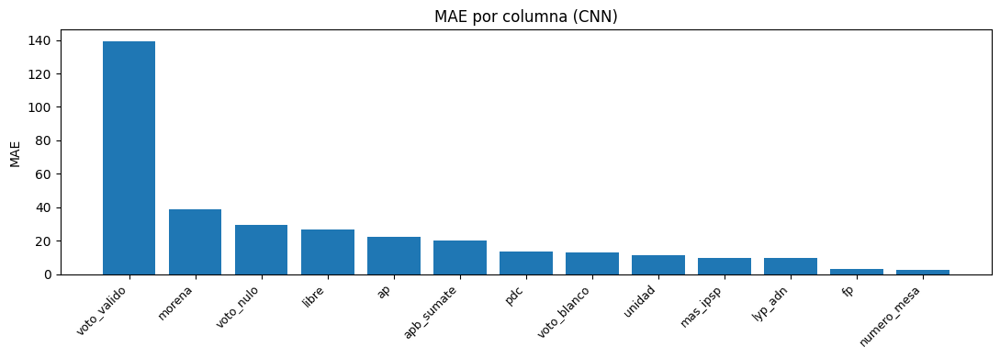

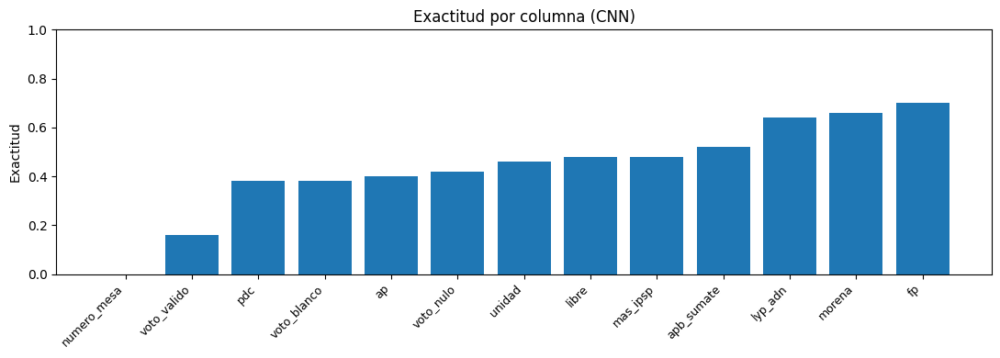

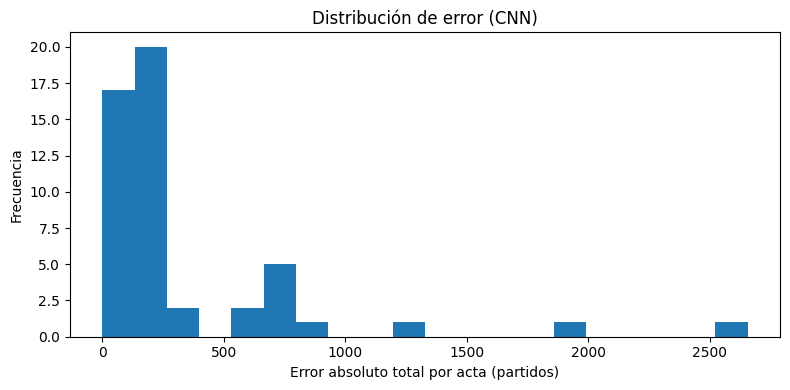

In [50]:
mae_items = sorted(mae_per_col.items(), key=lambda x: x[1], reverse=True)
acc_items = sorted(acc_per_col.items(), key=lambda x: x[1])

plt.figure(figsize=(11,4))
plt.bar([k for k,_ in mae_items], [v for _,v in mae_items])
plt.xticks(rotation=45, ha="right", fontsize=9)
plt.ylabel("MAE"); plt.title("MAE por columna (CNN)")
plt.tight_layout(); plt.show()

plt.figure(figsize=(11,4))
plt.bar([k for k,_ in acc_items], [v for _,v in acc_items])
plt.xticks(rotation=45, ha="right", fontsize=9)
plt.ylim(0,1); plt.ylabel("Exactitud"); plt.title("Exactitud por columna (CNN)")
plt.tight_layout(); plt.show()

plt.figure(figsize=(8,4))
plt.hist(report_df["total_abs_err_parties"], bins=20)
plt.xlabel("Error absoluto total por acta (partidos)")
plt.ylabel("Frecuencia"); plt.title("Distribución de error (CNN)")
plt.tight_layout(); plt.show()


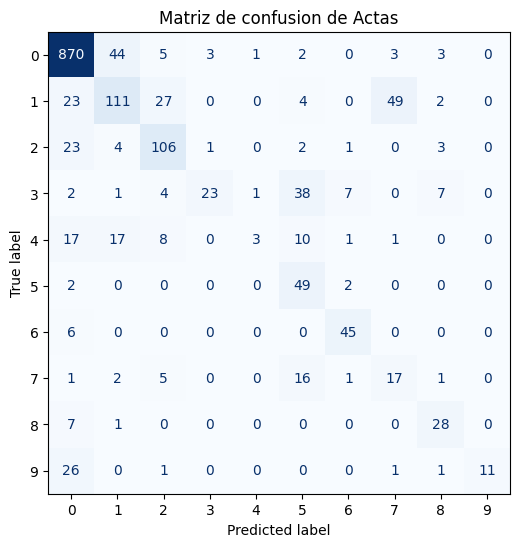

overall_digit_acc: 0.7654545454545455
digit 0: acc=0.934
digit 1: acc=0.514
digit 2: acc=0.757
digit 3: acc=0.277
digit 4: acc=0.053
digit 5: acc=0.925
digit 6: acc=0.882
digit 7: acc=0.395
digit 8: acc=0.778
digit 9: acc=0.275


In [161]:
# 6) matriz de confusion de digitos (0-9) para todas las actas
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re

# asegurar detailDf (per-file) y merged (pred/true por columna) existen
try:
    detailDf
except NameError:
    predDf, detailDf = processAllActasWithBars(actaDirs)  # usa tu funcion de antes

assert "acta_id" in detailDf.columns and "col" in detailDf.columns, "detailDf invalido"

# necesitamos 'merged' con *_true por columna (si no existe, rehacer merge rapido)
try:
    merged
except NameError:
    truthDfM = truthDf.copy()
    truthDfM["acta_key"] = truthDfM[idCol].astype(str).apply(normalizeName)
    predDfM  = predDf.copy()
    predDfM["acta_key"]  = predDfM["acta_id"].astype(str).apply(normalizeName)
    merged = predDfM.merge(truthDfM, on="acta_key", suffixes=("_pred","_true"), how="inner")

# mapa (acta_id, col_normalizada) -> valor verdadero entero
truthMap = {}
for _, r in merged.iterrows():
    for col in partyUniverse:
        tcol = col + "_true"
        if tcol in merged.columns:
            truthMap[(r["acta_id"], col)] = int(r[tcol])

# expandir lista de archivos (filename, digitPred, conf)
dd = detailDf.copy().explode("files", ignore_index=True)
dd = dd[dd["files"].notna()]
dd["fileName"]  = dd["files"].apply(lambda x: x[0])
dd["predDigit"] = dd["files"].apply(lambda x: int(x[1]))
dd["pos"]       = dd["fileName"].str.extract(r"(\d+)").astype(int)

# longitud maxima por grupo para padear el valor verdadero
groupMaxPos = dd.groupby(["acta_id","col"])["pos"].max().to_dict()

def trueDigitRow(row):
    key = (row["acta_id"], row["col"])
    trueVal = truthMap.get(key, None)
    if trueVal is None:
        return None
    maxPos = int(groupMaxPos.get(key, 1))
    s = str(int(trueVal)).zfill(maxPos)
    p = int(row["pos"])
    if 1 <= p <= len(s):
        return int(s[p-1])
    return None

dd["trueDigit"] = dd.apply(trueDigitRow, axis=1)
dd = dd.dropna(subset=["trueDigit"])

yTrue = dd["trueDigit"].astype(int).to_numpy()
yPred = dd["predDigit"].astype(int).to_numpy()

cm = confusion_matrix(yTrue, yPred, labels=list(range(10)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(range(10)))
fig, ax = plt.subplots(figsize=(6,6))
disp.plot(ax=ax, colorbar=False, cmap="Blues")
plt.title("Matriz de confusion de Actas")
plt.show()

accPerDigit = (cm.diagonal() / cm.sum(axis=1).clip(min=1))
print("overall_digit_acc:", float((yTrue == yPred).mean()))
for d, a in enumerate(accPerDigit):
    print(f"digit {d}: acc={a:.3f}")


## Mapeos (CSV ↔ nombres de columnas en BD)


In [56]:
# CSV normalizado -> nombre de columna en la tabla 'actas' (en mayúsculas)
csv_to_db = {
    "ap": "AP",
    "apb_sumate": "APB_SUMATE",
    "fp": "FP",
    "libre": "LIBRE",
    "lyp_adn": "LYP_ADN",
    "mas_ipsp": "MAS_IPSP",
    "morena": "MORENA",
    "pdc": "PDC",
    "unidad": "UNIDAD",
    "voto_blanco": "VOTOS_BLANCOS",
    "voto_nulo": "VOTOS_NULOS",
    "voto_valido": "VOTOS_VALIDOS",
}
# orden final de columnas en la tabla BD (además de id y mesa)
DB_COL_ORDER = ["AP","APB_SUMATE","FP","LIBRE","LYP_ADN","MAS_IPSP","MORENA","PDC","UNIDAD","VOTOS_BLANCOS","VOTOS_NULOS","VOTOS_VALIDOS"]


## Funciones: predicción acta (pre vs real) + tabla comparativa + métricas


In [57]:
import os, re, glob, pandas as pd, numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

def find_acta_dir(acta_id: str) -> str:
    path = os.path.join(BASE_ACTAS, acta_id)
    if os.path.isdir(path):
        return path
    # fallback por numero (acta_8 vs acta_08)
    m = re.search(r"\d+", acta_id)
    if m:
        n = int(m.group(0))
        for d in os.listdir(BASE_ACTAS):
            if d.startswith("acta_"):
                k = re.search(r"\d+", d)
                if k and int(k.group(0)) == n:
                    return os.path.join(BASE_ACTAS, d)
    return None

def get_truth_row(acta_id: str):
    df = truth_df.copy()
    df["__key__"] = df[ID_COL].astype(str).apply(normalizeName)
    row = df[df["__key__"] == normalizeName(acta_id)]
    if not row.empty: return row.iloc[0]
    # fallback por numero
    m = re.search(r"\d+", acta_id)
    if m:
        n = int(m.group(0))
        df["__num__"] = df[ID_COL].str.extract(r"(\d+)").astype(float)
        row = df[df["__num__"] == n]
        if not row.empty: return row.iloc[0]
    return None

def predict_party_folder_with_detail(party_folder: str):
    files = glob.glob(os.path.join(party_folder, "*.png"))
    def key_fn(p):
        m = re.search(r"(\d+)", os.path.basename(p))
        return int(m.group(1)) if m else 0
    files = sorted(files, key=key_fn)
    digits, detail = [], []
    pbar = tqdm(files, desc=f"party:{os.path.basename(party_folder)}", leave=False)
    for p in pbar:
        d, c = predict_digit_from_pil(Image.open(p).convert("L"))
        digits.append(str(d)); detail.append((os.path.basename(p), d, c))
    s = "".join(digits).lstrip("0")
    return (int(s) if s else 0), detail

def predict_one_acta_compare(acta_id: str):
    """Devuelve:
       - df_cmp: DataFrame con columnas [columna_db, pre, real, ok, abs_err]
       - metrics: dict con accuracy, mae, total_abs_err, mesa_pred/mesa_true/mesa_ok, row_exact
       - pres_path: ruta a proceso01/presidente.jpg si existe
    """
    acta_dir = find_acta_dir(acta_id)
    assert acta_dir, f"No se encontró {acta_id}"
    p04 = os.path.join(acta_dir, "proceso04")

    # --- mesa por CNN ---
    mesa_img = os.path.join(p04, "mesa.png")
    mesa_pred, mesa_det, mesa_crops = predict_mesa_cnn(mesa_img)

    # --- partidos presentes ---
    present = sorted([d for d in os.listdir(p04) if os.path.isdir(os.path.join(p04, d))])
    present_norm = {normalizeName(n): n for n in present}

    # predicciones por columna CSV
    pred_vals = {}
    for csv_col in party_universe:  # usa universo del CSV
        folder_name = present_norm.get(csv_col)
        if folder_name:
            votos, det = predict_party_folder_with_detail(os.path.join(p04, folder_name))
            pred_vals[csv_col] = int(votos)
        else:
            pred_vals[csv_col] = 0

    # verdad
    row = get_truth_row(acta_id)
    assert row is not None, f"No hay fila de verdad para {acta_id}"
    real_vals = {c: int(row[c]) for c in party_universe if c in row.index}
    mesa_true = int(row.get("numero_mesa", 0))

    # tabla comparativa
    rows = []
    for csv_col in party_universe:
        db_col = csv_to_db.get(csv_col, csv_col.upper())
        pre  = int(pred_vals.get(csv_col, 0))
        real = int(real_vals.get(csv_col, 0))
        ok   = int(pre == real)
        rows.append({"columna_db": db_col, "pre": pre, "real": real, "ok": ok, "abs_err": abs(pre-real)})
    df_cmp = pd.DataFrame(rows).sort_values("columna_db")

    # métricas
    accuracy = float(df_cmp["ok"].mean()) if len(df_cmp) else np.nan
    mae      = float(df_cmp["abs_err"].mean()) if len(df_cmp) else np.nan
    total_abs_err = int(df_cmp["abs_err"].sum()) if len(df_cmp) else 0
    mesa_ok  = int(mesa_pred == mesa_true)
    row_exact = int(bool(mesa_ok and (df_cmp["ok"].sum() == len(df_cmp))))

    metrics = {
        "acta_id": acta_id,
        "mesa_pred": int(mesa_pred),
        "mesa_true": int(mesa_true),
        "mesa_ok": mesa_ok,
        "accuracy_partidos": accuracy,
        "mae_partidos": mae,
        "total_abs_err_partidos": total_abs_err,
        "row_exact": row_exact
    }

    # imagen presidente
    pres_path = None
    for ext in ("jpg","png"):
        p = os.path.join(acta_dir, "proceso01", f"presidente.{ext}")
        if os.path.isfile(p):
            pres_path = p; break

    return df_cmp, metrics, pres_path


## Ejecutar en un acta (ejemplo `acta_08`), mostrar tabla y la imagen PRESIDENTE


party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

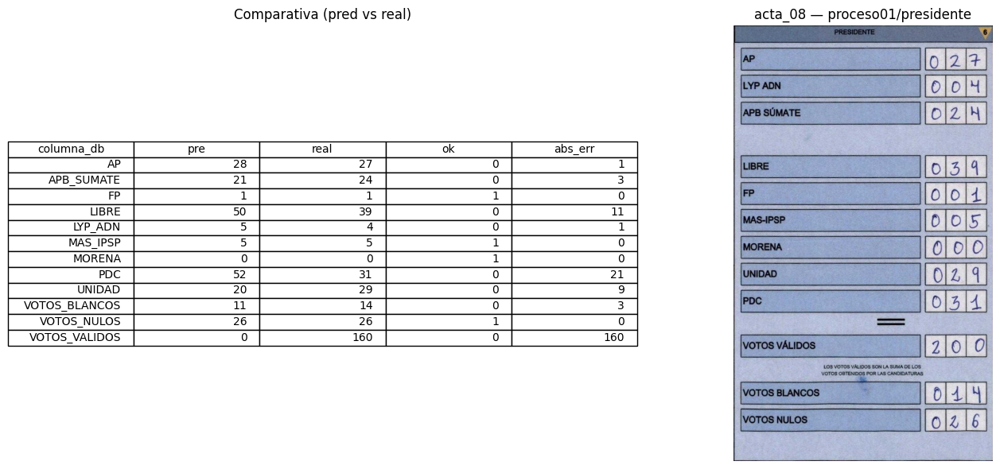


Resumen acta_08:
  mesa_pred=0 | mesa_true=3 | mesa_ok=0
  accuracy_partidos=0.333 | mae_partidos=17.417 | total_abs_err=209 | row_exact=0


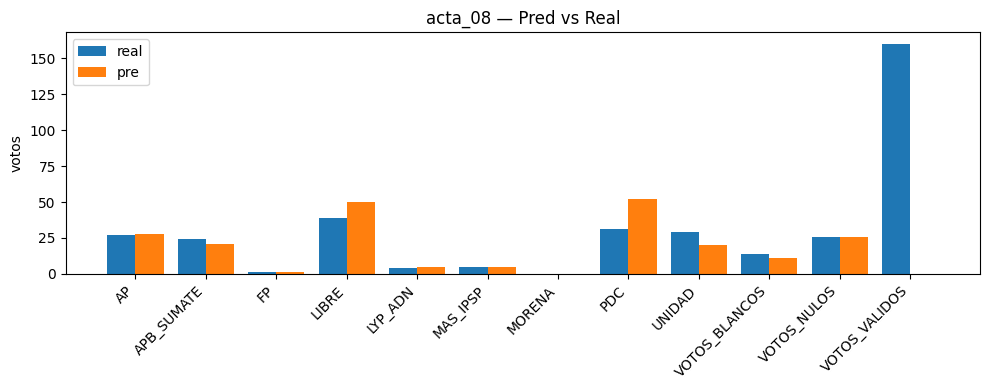

In [162]:
target = "acta_08"  # cambia a acta_45, etc.
df_cmp, metrics, pres_path = predict_one_acta_compare(target)

# --- Configurar los subplots para mostrar la tabla y la imagen una al lado de la otra ---
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg
from PIL import Image

# Crear la figura principal con un diseño de 1 fila y 2 columnas
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# --- Subplot 1: Tabla comparativa ---
axs[0].axis('tight')
axs[0].axis('off')
table = axs[0].table(cellText=df_cmp.values, colLabels=df_cmp.columns, loc='center')
table.auto_set_font_size(False)
table.set_fontsize(10)
axs[0].set_title("Comparativa (pred vs real)", fontsize=12)

# --- Subplot 2: Imagen del presidente ---
if pres_path and os.path.exists(pres_path):
    axs[1].imshow(Image.open(pres_path))
    axs[1].axis("off")
    axs[1].set_title(f"{target} — proceso01/presidente", fontsize=12)
else:
    axs[1].axis("off")
    axs[1].text(0.5, 0.5, "No se encontró la imagen del presidente", ha='center', va='center')

plt.tight_layout()
plt.show()

# --- Impresión del resumen de métricas ---
print(f"\nResumen {metrics['acta_id']}:")
print(f"  mesa_pred={metrics['mesa_pred']} | mesa_true={metrics['mesa_true']} | mesa_ok={metrics['mesa_ok']}")
print(f"  accuracy_partidos={metrics['accuracy_partidos']:.3f} | mae_partidos={metrics['mae_partidos']:.3f} | total_abs_err={metrics['total_abs_err_partidos']} | row_exact={metrics['row_exact']}")

# --- Gráfico rápido Pred vs Real ---
plt.figure(figsize=(10,4))
x = np.arange(len(df_cmp))
plt.bar(x-0.4/2, df_cmp["real"], 0.4, label="real")
plt.bar(x+0.4/2, df_cmp["pre"],  0.4, label="pre")
plt.xticks(x, df_cmp["columna_db"], rotation=45, ha="right")
plt.ylabel("votos"); plt.title(f"{target} — Pred vs Real")
plt.legend(); plt.tight_layout(); plt.show()

## 7.3 **Crear** BD SQLite con la tabla `actas` (campos exactos) y **guardar** lo predicho


In [150]:
# Celda 1 — ELIMINAR BD anterior (si existe)
import os

DB_DIR  = "/content/drive/MyDrive/ActasFile"
os.makedirs(DB_DIR, exist_ok=True)
DB_PATH = os.path.join(DB_DIR, "actas_pred_flat.db")

if os.path.exists(DB_PATH):
    os.remove(DB_PATH)
    print("BD eliminada:", DB_PATH)
else:
    print("No había BD previa:", DB_PATH)


BD eliminada: /content/drive/MyDrive/ActasFile/actas_pred_flat.db


In [151]:
# Celda 2 — RECREAR BD con SOLO num_acta (PRIMARY KEY) + helpers
import re, sqlite3, pandas as pd

# Mapeo CSV -> columnas de BD (en mayúsculas)
csv_to_db = {
    "ap": "AP",
    "apb_sumate": "APB_SUMATE",
    "fp": "FP",
    "libre": "LIBRE",
    "lyp_adn": "LYP_ADN",
    "mas_ipsp": "MAS_IPSP",
    "morena": "MORENA",
    "pdc": "PDC",
    "unidad": "UNIDAD",
    "voto_blanco": "VOTOS_BLANCOS",
    "voto_nulo": "VOTOS_NULOS",
    "voto_valido": "VOTOS_VALIDOS",
}
DB_COL_ORDER = ["AP","APB_SUMATE","FP","LIBRE","LYP_ADN","MAS_IPSP","MORENA","PDC","UNIDAD",
                "VOTOS_BLANCOS","VOTOS_NULOS","VOTOS_VALIDOS"]

def normalizeName(s: str):
    s = str(s).strip().lower()
    s = re.sub(r"[^a-z0-9]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

def extract_num(s: str):
    m = re.search(r"(\d+)$", str(s))
    return int(m.group(1)) if m else None

def connect_db(db_path=DB_PATH):
    conn = sqlite3.connect(db_path)
    conn.execute("PRAGMA foreign_keys=ON;")
    return conn

def recreate_schema(conn):
    conn.executescript(f"""
    CREATE TABLE actas (
        num_acta INTEGER PRIMARY KEY,        -- p.ej. 46
        mesa INTEGER,                        -- número de mesa (pred CNN)
        {', '.join([f'{c} INTEGER' for c in DB_COL_ORDER])},
        created_at TEXT DEFAULT (datetime('now'))
    );
    """)
    conn.commit()

def upsert_acta_by_num(conn, num_acta: int, mesa_pred: int, preds_by_csv: dict):
    # construir fila con columnas de BD
    row = {"num_acta": int(num_acta), "mesa": int(mesa_pred)}
    for csv_col, val in preds_by_csv.items():
        db_col = csv_to_db.get(csv_col, csv_col.upper())
        if db_col in DB_COL_ORDER:
            row[db_col] = int(val)
    for k in DB_COL_ORDER:
        row.setdefault(k, 0)

    cols = ["num_acta","mesa"] + DB_COL_ORDER
    placeholders = ",".join(["?"]*len(cols))
    sets = ",".join([f"{c}=excluded.{c}" for c in cols if c != "num_acta"])  # no tocar PK al actualizar
    sql  = f"INSERT INTO actas ({','.join(cols)}) VALUES ({placeholders}) ON CONFLICT(num_acta) DO UPDATE SET {sets};"
    values = [row.get("num_acta"), row.get("mesa")] + [row[k] for k in DB_COL_ORDER]
    conn.execute(sql, tuple(values))
    conn.commit()

def listar_bd(conn):
    cols_q = "num_acta, mesa, " + ",".join(DB_COL_ORDER) + ", created_at"
    df = pd.read_sql_query(f"SELECT {cols_q} FROM actas ORDER BY num_acta ASC;", conn)
    print(f"Total filas: {len(df)}")
    display(df)

# crear BD desde cero
conn = connect_db()
recreate_schema(conn)
print("BD creada en:", DB_PATH)


BD creada en: /content/drive/MyDrive/ActasFile/actas_pred_flat.db


In [163]:
# Celda 3 — Elegir ACTA y correr inferencia (CNN) para obtener comparativa y métricas
# Requiere que ya tengas definida: predict_one_acta_compare(target)

target = "acta_37"  # <<-- tu acta de referencia

df_cmp, metrics, pres_path = predict_one_acta_compare(target)
print("Resumen inferencia:")
print(f"  mesa_pred={metrics['mesa_pred']} | mesa_true={metrics['mesa_true']} | mesa_ok={metrics['mesa_ok']}")
print(f"  accuracy_partidos={metrics['accuracy_partidos']:.3f} | mae_partidos={metrics['mae_partidos']:.3f} | total_abs_err={metrics['total_abs_err_partidos']} | row_exact={metrics['row_exact']}")


party:AP:   0%|          | 0/3 [00:00<?, ?it/s]

party:LYP ADN:   0%|          | 0/3 [00:00<?, ?it/s]

party:APB SUMATE:   0%|          | 0/3 [00:00<?, ?it/s]

party:LIBRE:   0%|          | 0/3 [00:00<?, ?it/s]

party:FP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MAS-IPSP:   0%|          | 0/3 [00:00<?, ?it/s]

party:MORENA:   0%|          | 0/3 [00:00<?, ?it/s]

party:UNIDAD:   0%|          | 0/3 [00:00<?, ?it/s]

party:PDC:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_valido:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_blanco:   0%|          | 0/3 [00:00<?, ?it/s]

party:voto_nulo:   0%|          | 0/3 [00:00<?, ?it/s]

Resumen inferencia:
  mesa_pred=0 | mesa_true=1 | mesa_ok=0
  accuracy_partidos=0.333 | mae_partidos=12.583 | total_abs_err=151 | row_exact=0


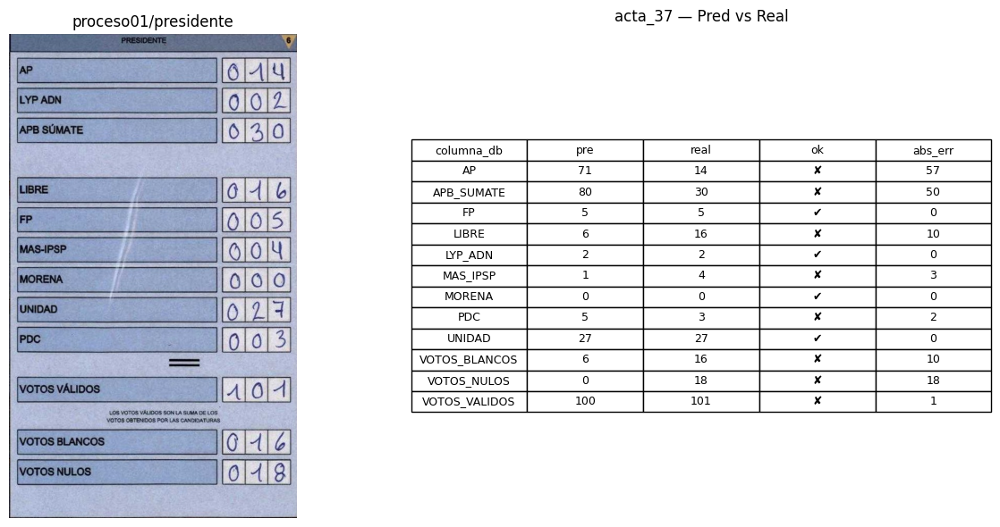

In [164]:
# Celda 4 — Mostrar PRESIDENTE + tabla comparativa al lado (una figura)
import matplotlib.pyplot as plt
from PIL import Image

def show_side_by_side(pres_path, df_cmp, title="Pred vs Real (partidos)"):
    view = df_cmp[["columna_db","pre","real","ok","abs_err"]].copy()
    view["ok"] = view["ok"].map({1:"✔",0:"✘"})
    fig, (ax_img, ax_tbl) = plt.subplots(1,2, figsize=(14,6), gridspec_kw={"width_ratios":[3,2]})
    if pres_path is not None:
        ax_img.imshow(Image.open(pres_path)); ax_img.set_title("proceso01/presidente", fontsize=12); ax_img.axis("off")
    else:
        ax_img.axis("off"); ax_img.text(0.5, 0.5, "Sin imagen PRESIDENTE", ha="center", va="center", fontsize=12)
    ax_tbl.axis("off")
    tbl = ax_tbl.table(cellText=view.values, colLabels=view.columns, loc="center", cellLoc="center")
    tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1.1, 1.2)
    ax_tbl.set_title(title, fontsize=12, pad=10)
    plt.tight_layout(); plt.show()

show_side_by_side(pres_path, df_cmp, title=f"{target} — Pred vs Real")


In [165]:
# Celda 5 — Construir predicciones y ENVIAR a la BD (PK = num_acta)
# Usa los datos ya calculados en df_cmp/metrics

# <csv_col_normalizada -> pred>
inv_map = {v:k for k,v in csv_to_db.items()}
preds_by_csv = {inv_map.get(r["columna_db"], normalizeName(r["columna_db"])): int(r["pre"])
                for _, r in df_cmp.iterrows()}

num_acta = extract_num(target)
assert num_acta is not None, f"No pude extraer num_acta de: {target}"

upsert_acta_by_num(conn, num_acta=num_acta, mesa_pred=metrics["mesa_pred"], preds_by_csv=preds_by_csv)
print(f"Guardado en BD (num_acta={num_acta})")

# ver fila insertada/actualizada
import pandas as pd
cols_q = "num_acta, mesa, " + ",".join(DB_COL_ORDER) + ", created_at"
display(pd.read_sql_query(f"SELECT {cols_q} FROM actas WHERE num_acta = ?", conn, params=(num_acta,)))


Guardado en BD (num_acta=37)


,num_acta,mesa,AP,APB_SUMATE,FP,LIBRE,LYP_ADN,MAS_IPSP,MORENA,PDC,UNIDAD,VOTOS_BLANCOS,VOTOS_NULOS,VOTOS_VALIDOS,created_at
0,37,0,71,80,5,6,2,1,0,5,27,6,0,100,2025-08-29 07:33:08


In [166]:
# Celda 6 — Listar COMPLETA la tabla 'actas' (en Drive) — SOLO num_acta (sin id/folio)
listar_bd(conn)


Total filas: 3


,num_acta,mesa,AP,APB_SUMATE,FP,LIBRE,LYP_ADN,MAS_IPSP,MORENA,PDC,UNIDAD,VOTOS_BLANCOS,VOTOS_NULOS,VOTOS_VALIDOS,created_at
0,22,0,15,18,2,0,1,0,113,1,55,0,5,200,2025-08-29 07:23:58
1,37,0,71,80,5,6,2,1,0,5,27,6,0,100,2025-08-29 07:33:08
2,46,0,8,22,0,60,0,5,0,15,68,2,16,128,2025-08-29 07:23:33
